/home/shubhamkn22/.conda/envs/new-gpu-env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-11-11 19:07:05.535996: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-11 19:07:05.584888: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-11-11 19:07:06.658196: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. Y

!!! FORCING SCRIPT TO RUN ON GPU 0 ONLY !!!
Enabled memory growth for 1 GPUs
 =================== Starting Tree-Fusion (PCA + Magpie) =================== 
 =================== Step 1/5: Loading and aligning data =================== 
Successfully loaded '6059_rows.csv'
Loaded 6059 3D samples with shape (16, 16, 16, 16).
 =================== Step 2/5: Generating Magpie features =================== 


ElementProperty: 100%|█████████████████████| 6059/6059 [00:36<00:00, 166.91it/s]


Generated Magpie features with shape: (6059, 132)
 =================== Step 3/5: Applying outlier removal =================== 
Original data shape: 6059
Removed 65 outliers
Data shape after outlier removal: 5994
 =================== Step 4/5: Engineering all 1D features =================== 
PCA complete. Explained variance: 0.8252
Created combined feature matrix with shape: (5994, 644)
 =================== Step 5/5: Creating KFold data splits =================== 
Train/Val/Test shapes: (4795, 644), (599, 644), (600, 644)

 =================== Starting Optuna Hyperparameter Search ===================
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 142646
[LightGBM] [Info] Number of data points in the train set: 4795, number of used features: 644
[LightGBM] [Info] Using GPU Device: NVIDIA A40, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin

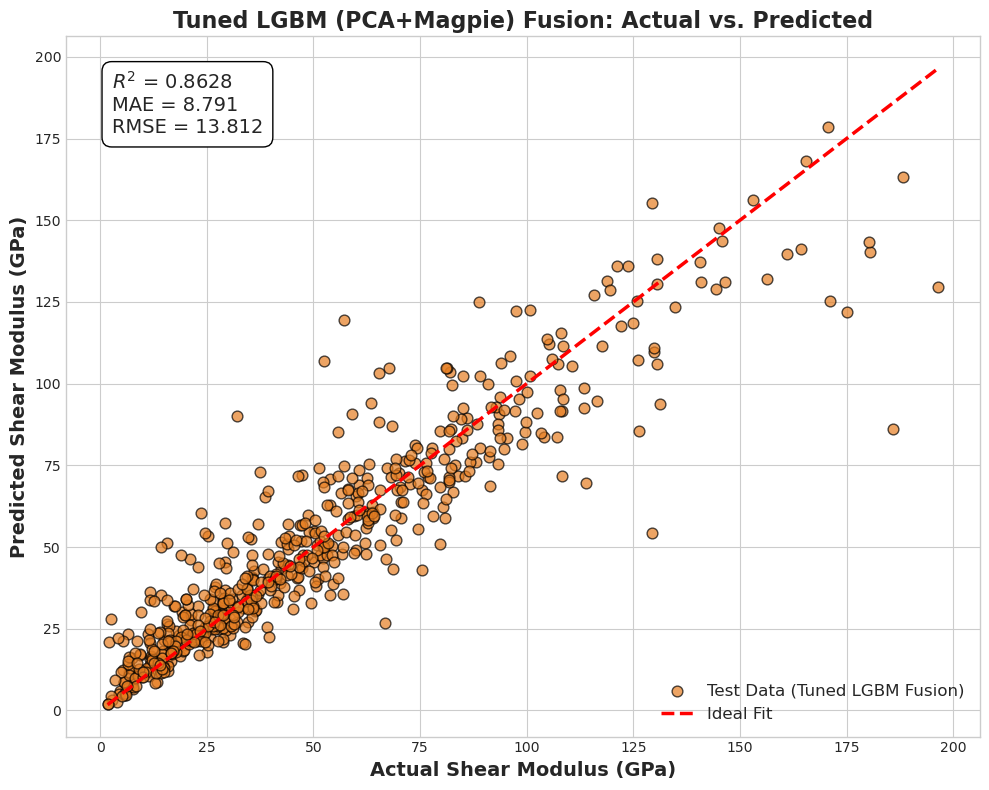

Script complete. Final model saved to 'To_Publish_Shear_Modulus_Best_On_CNN.pkl' and plot to 'To_Publish_Shear_Modulus_Best_On_CNN.png'


In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.decomposition import PCA
import lightgbm as lgb
import os
import random
import matplotlib.pyplot as plt
import warnings
from scipy import stats
import optuna
import joblib
import tensorflow as tf
from matminer.featurizers.composition import ElementProperty
from pymatgen.core.composition import Composition

# --- 0. FORCE SINGLE GPU ---
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
print("!!! FORCING SCRIPT TO RUN ON GPU 0 ONLY !!!")

# --- 0. SET GPU MEMORY GROWTH ---
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"Enabled memory growth for {len(gpus)} GPUs")
    except RuntimeError as e:
        print(e)

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING) # Suppress Optuna logs

# --- 1. SETUP AND REPRODUCIBILITY ---
seed_value = 42
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)

# --- 2. ALIGN, LOAD, AND CLEAN DATA ---
print(" =================== Starting Tree-Fusion (PCA + Magpie) =================== ")
print(" =================== Step 1/5: Loading and aligning data =================== ")
try:
    df_main = pd.read_csv('6059_rows.csv')
    print("Successfully loaded '6059_rows.csv'")
except FileNotFoundError as e:
    print(f"Error: Could not find data file. {e}")
    exit()

X_3d_list = []
y_list = []
formula_list = [] 
found_formulas_sp = [] 
input_dir = 'input_cnn'
for index, row in df_main.iterrows():
    file_path = os.path.join(input_dir, f"{row['formula_sp']}_latent.npy")
    if os.path.exists(file_path):
        X_3d_list.append(np.load(file_path))
        y_list.append(row['shear_hill']) # <-- TARGET: shear_hill
        formula_list.append(row['formula_pretty']) 
        found_formulas_sp.append(row['formula_sp'])

X_3d_raw = np.array(X_3d_list)
y = np.array(y_list)
print(f"Loaded {X_3d_raw.shape[0]} 3D samples with shape {X_3d_raw.shape[1:]}.")

print(" =================== Step 2/5: Generating Magpie features =================== ")
ep_featurizer = ElementProperty.from_preset("magpie")
try:
    compositions = [Composition(f) for f in formula_list]
    X_magpie = ep_featurizer.featurize_many(compositions)
    X_magpie = np.array(X_magpie)
    X_magpie = np.nan_to_num(X_magpie, nan=0.0, posinf=0.0, neginf=0.0)
    print(f"Generated Magpie features with shape: {X_magpie.shape}")
except Exception as e:
    print(f"Error parsing formulas: {e}. Aborting.")
    exit()

print(" =================== Step 3/5: Applying outlier removal =================== ")
def remove_outliers_advanced(X_3d_in, X_magpie_in, y_in):
    print(f"Original data shape: {X_3d_in.shape[0]}")
    Q1, Q3 = np.percentile(y_in, [10, 90]); IQR = Q3 - Q1
    mask1 = (y_in >= (Q1 - 2 * IQR)) & (y_in <= (Q3 + 2 * IQR))
    z_scores = np.abs(stats.zscore(y_in)); mask2 = z_scores < 3.5
    mask = mask1 & mask2
    print(f"Removed {len(y_in) - np.sum(mask)} outliers")
    return X_3d_in[mask], X_magpie_in[mask], y_in[mask]

X_3d_raw, X_magpie, y = remove_outliers_advanced(X_3d_raw, X_magpie, y)
print(f"Data shape after outlier removal: {X_3d_raw.shape[0]}")

# --- 3. FEATURE ENGINEERING & SCALING ---
print(" =================== Step 4/5: Engineering all 1D features =================== ")
# 1. PCA Features (from 3D data)
X_3d_flat = X_3d_raw.reshape(X_3d_raw.shape[0], -1)
scaler_3d = StandardScaler()
X_3d_flat_scaled = scaler_3d.fit_transform(X_3d_flat)

n_components_pca = 512 
pca = PCA(n_components=n_components_pca, random_state=seed_value)
X_pca = pca.fit_transform(X_3d_flat_scaled)
print(f"PCA complete. Explained variance: {np.sum(pca.explained_variance_ratio_):.4f}")

# 2. Magpie Features (Chemical data)
scaler_magpie = StandardScaler()
X_magpie_scaled = scaler_magpie.fit_transform(X_magpie)

# 3. Combine into one feature matrix
X_combined = np.concatenate([X_pca, X_magpie_scaled], axis=1)
print(f"Created combined feature matrix with shape: {X_combined.shape}")

# 4. Target variable
scaler_y = RobustScaler()
y_scaled_ref = scaler_y.fit_transform(y.reshape(-1, 1)).flatten() # Just for reference

# --- 4. SPLITTING ---
print(" =================== Step 5/5: Creating KFold data splits =================== ")
kf = KFold(n_splits=5, shuffle=True, random_state=seed_value)
train_idx, temp_idx = next(kf.split(y))
val_idx, test_idx = train_test_split(temp_idx, test_size=0.5, random_state=seed_value)

X_train, X_val, X_test = X_combined[train_idx], X_combined[val_idx], X_combined[test_idx]
y_train, y_val, y_test = y[train_idx], y[val_idx], y[test_idx] # <-- Use raw y

print(f"Train/Val/Test shapes: {X_train.shape}, {X_val.shape}, {X_test.shape}")

# --- 5. HYPERPARAMETER TUNING WITH OPTUNA ---
print("\n =================== Starting Optuna Hyperparameter Search ===================")

def objective(trial):
    """Optuna objective function to find best LGBM params."""
    
    # Define the search space for hyperparameters
    params = {
        'objective': 'regression_l1', # Use L1 (MAE) for robustness
        'metric': 'rmse',
        'random_state': seed_value,
        'n_estimators': 5000, # High number, will be stopped early
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.03, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 31, 255),
        'max_depth': trial.suggest_int('max_depth', 8, 20),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 0.5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 0.5),
        'n_jobs': -1,
        'device': 'gpu'
    }
    
    model = lgb.LGBMRegressor(**params)
    
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric='rmse',
        callbacks=[lgb.early_stopping(100, verbose=False)] # Shorter patience for tuning
    )
    
    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    
    trial.set_user_attr('best_iteration', model.best_iteration_)
    
    return rmse

# Create a study and optimize
study = optuna.create_study(direction='minimize') # We want to minimize RMSE
study.optimize(objective, n_trials=100) # Run 100 trials

print("\nOptuna search complete.")
print(f"Best validation RMSE: {study.best_value:.4f}")
print("Best hyperparameters found:")
print(study.best_params)

# --- 6. RETRAIN FINAL MODEL WITH BEST PARAMETERS ---
print("\n =================== Retraining Final Model with Best Params ===================")

# Get the best params and optimal number of estimators
final_params = study.best_params
final_n_estimators = study.best_trial.user_attrs['best_iteration']
if final_n_estimators is None or final_n_estimators <= 0:
    print("Warning: Best iteration not found, using 5000 with early stopping.")
    final_n_estimators = 5000
    
# Update params for final training
final_params.update({
    'random_state': seed_value,
    'n_estimators': final_n_estimators, # Use the exact best number of trees
    'device': 'gpu',
    'n_jobs': -1,
    'objective': 'regression_l1', # Keep objective
    'metric': 'rmse'              # Keep metric
})

model_lgbm_tuned = lgb.LGBMRegressor(**final_params)

# Combine train and validation data for final model training
X_train_final = np.concatenate([X_train, X_val], axis=0)
y_train_final = np.concatenate([y_train, y_val], axis=0)
print(f"Training final model on combined data ({X_train_final.shape[0]} samples)...")

# Train on the combined data.
if final_n_estimators == 5000:
    print("Training with 5000 estimators and early stopping (fallback).")
    model_lgbm_tuned.fit(X_train, y_train, 
                         eval_set=[(X_val, y_val)],
                         eval_metric='rmse',
                         callbacks=[lgb.early_stopping(200, verbose=True)])
else:
    print(f"Training with optimal {final_n_estimators} estimators.")
    model_lgbm_tuned.fit(X_train_final, y_train_final)

# --- 7. SAVE THE FINAL MODEL ---
# *** THIS IS THE NEW LINE YOU REQUESTED ***
model_filename = 'To_Publish_Shear_Modulus_Best_On_CNN.pkl'
joblib.dump(model_lgbm_tuned, model_filename)
print(f"\nFinal Tuned LGBM Model saved as: {model_filename}")
# *** END NEW LINE ***

# --- 8. EVALUATE THE FINAL TUNED MODEL ---
print("\n =================== Evaluating Final Tuned LGBM Model ===================")
y_pred = model_lgbm_tuned.predict(X_test)

y_test_orig = y_test
y_pred_orig = y_pred

r2 = r2_score(y_test_orig, y_pred_orig)
mae = mean_absolute_error(y_test_orig, y_pred_orig)
rmse = np.sqrt(mean_squared_error(y_test_orig, y_pred_orig))

print("\n" + "="*60); 
print(" =================== FINAL 'TUNED TREE-FUSION' MODEL RESULTS ==================="); 
print("="*60)
print(f" R² Score:   {r2:.4f}"); 
print(f" MAE:        {mae:.4f}"); 
print(f" RMSE:       {rmse:.4f}")
print("="*60)

# --- 9. VISUALIZATION ---
print("Generating final plot...")
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(10, 8))

plt.scatter(y_test_orig, y_pred_orig, alpha=0.7, edgecolors='k', c='#e67e22', s=60, label="Test Data (Tuned LGBM Fusion)")
ideal_line = [min(y_test_orig.min(), y_pred_orig.min()), max(y_test_orig.max(), y_pred_orig.max())]
plt.plot(ideal_line, ideal_line, 'r--', lw=2.5, label="Ideal Fit")

metrics_text = (
    fr'$R^2$ = {r2:.4f}' + '\n' +
    fr'MAE = {mae:.3f}' + '\n' +
    fr'RMSE = {rmse:.3f}'
)
plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes,
         fontsize=14, verticalalignment='top', horizontalalignment='left',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

plt.xlabel("Actual Shear Modulus (GPa)", fontsize=14, fontweight='bold')
plt.ylabel("Predicted Shear Modulus (GPa)", fontsize=14, fontweight='bold')
plt.title(r'Tuned LGBM (PCA+Magpie) Fusion: Actual vs. Predicted', fontsize=16, fontweight='bold')
plt.legend(fontsize=12, loc='lower right')
plt.tight_layout()

# *** THIS IS THE SECOND CHANGE YOU REQUESTED ***
plot_filename = "To_Publish_Shear_Modulus_Best_On_CNN.png"
plt.savefig(plot_filename, dpi=300)
plt.show()

print(f"Script complete. Final model saved to '{model_filename}' and plot to '{plot_filename}'")